<a href="https://colab.research.google.com/github/AmirmahdiTavakoli/Sentiment-Analysis-of-Amazon-Reviews/blob/main/NLP_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install fuzzywuzzy -q
!pip install levenshtein -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 169.4/169.4 kB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 43.1 MB/s eta 0:00:00


**Download train_data.csv, test_data.csv and GloVe word embeddings.**

In [ ]:
!gdown -q 1-AlW7oNJHaqi3xk_9dWHUS52Dzl_FmFW
!gdown -q 1-8TsrqTRFP-q9TM-6HinhO0ZVXFHq9TB
!gdown -q 1I9aPAvvYgQWdHGKtnd7IeTGXpx8vOm4h

In [ ]:
# Use if the cell above fails
!gdown -q 1-F7f9oSjFx0Si44DvdkzFhjjwfro_Y1p
!gdown -q 1-Cb-kBGlVW6PPX4bR7IeZyU1lB0WoW2K
!gdown -q 1-CT2mHNnjfbTjVNS_akLqTtL2oPQi4R9

In [ ]:
!wget -q http://nlp.stanford.edu/data/glove.6B.zip
!unzip -q glove.6B.zip

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
df = pd.read_csv('train_data.csv', parse_dates=[3], low_memory=False)
title_brand_df = pd.read_csv('title_brand.csv')
df = df.merge(title_brand_df, on='asin', how='left')
df.drop(columns='unixReviewTime', inplace=True)
df['vote'].fillna(0, inplace=True)
df['vote'] = df['vote'].replace(',', '', regex=True)
df['vote'] = df['vote'].astype(float).astype(int)
df.drop_duplicates(inplace=True)

### Part 1 : Exploratory data analysis

In [ ]:
df.head()

,overall,vote,verified,reviewTime,reviewerID,asin,style,reviewerName,reviewText,summary,title,brand
0,2,0,False,2016-11-11,A2OSUEZJIN7BI,0511189877,NaN,Chris,I have an older URC-WR7 remote and thought thi...,Cannot Learn,CLIKR-5 Time Warner Cable Remote Control UR5U-...,URC
1,5,0,True,2016-06-06,A2NETQRG6JHIG7,0511189877,NaN,Qrysta White,First time I've EVER had a remote that needed ...,zero programming needed! Miracle!?,CLIKR-5 Time Warner Cable Remote Control UR5U-...,URC
2,4,0,True,2016-03-10,A12JHGROAX49G7,0511189877,NaN,Linwood,Got them and only 2 of them worked. company ca...,Works Good and programs easy.,CLIKR-5 Time Warner Cable Remote Control UR5U-...,URC
3,5,0,True,2016-01-14,A1KV65E2TMMG6F,0511189877,NaN,Dane Williams,I got tired of the remote being on the wrong s...,Same as TWC remote,CLIKR-5 Time Warner Cable Remote Control UR5U-...,URC
4,5,0,True,2016-10-20,A280POPEWI0NSA,0594459451,NaN,Kristina H.,After purchasing cheap cords from another webs...,Good Quality Cord,Barnes &amp; Noble Nook Color Tablet USB Cable...,Barnes &amp; Noble


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 830617 entries, 0 to 855678
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   overall       830617 non-null  int64         
 1   vote          830617 non-null  int64         
 2   verified      830617 non-null  bool          
 3   reviewTime    830617 non-null  datetime64[ns]
 4   reviewerID    830617 non-null  object        
 5   asin          830617 non-null  object        
 6   style         485258 non-null  object        
 7   reviewerName  830418 non-null  object        
 8   reviewText    830617 non-null  object        
 9   summary       830544 non-null  object        
 10  title         830550 non-null  object        
 11  brand         829558 non-null  object        
dtypes: bool(1), datetime64[ns](1), int64(2), object(8)
memory usage: 76.8+ MB


In [ ]:
df.describe(include='all')

<ipython-input-8-174ba9bf1a5c>:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  df.describe(include='all')


,overall,vote,verified,reviewTime,reviewerID,asin,style,reviewerName,reviewText,summary,title,brand
count,830617.000000,830617.000000,830617,830617,830617,830617,485258,830418,830617,830544,830550,829558
unique,NaN,NaN,2,1007,321135,90715,40887,234103,807611,696897,89302,14590
top,NaN,NaN,True,2016-01-04 00:00:00,A680RUE1FDO8B,B010OYASRG,{'Color:': ' Black'},Amazon Customer,"Great cable, worked exactly as expected. The ...",Five Stars,OontZ Angle 3 Enhanced Stereo Edition IPX5 Spl...,Logitech
freq,NaN,NaN,712808,1954,158,1852,43407,24578,16,947,1852,16829
first,NaN,NaN,NaN,2016-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,NaN,NaN,NaN,2018-10-03 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,4.020108,1.731445,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,1.344719,13.336002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,1.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,3.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


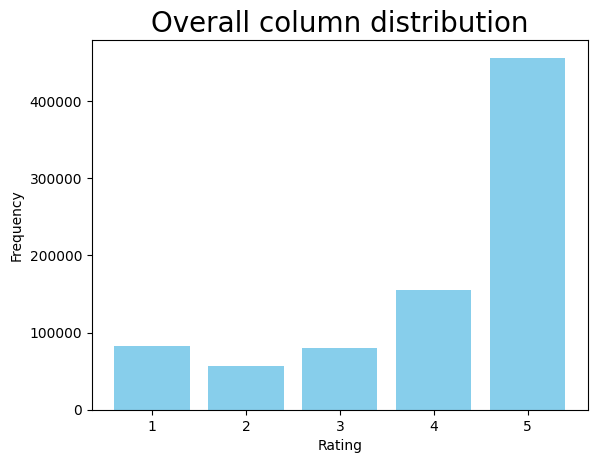

In [ ]:
plt.hist(df['overall'], bins=[1, 2, 3, 4, 5, 6], align='left', rwidth=0.8, color='skyblue')
plt.xlabel('Rating')
plt.ylabel('Frequency')
plt.title('Overall column distribution', size=20)
plt.show()

In [ ]:
df['overall'].value_counts()

5    456479
4    155143
1     82247
3     80460
2     56288
Name: overall, dtype: int64

#### ☁ Word cloud of Positive, Neutral and Negative reviews.

In [ ]:
from wordcloud import WordCloud, STOPWORDS
import string
import matplotlib.pyplot as plt

stop_words = set(STOPWORDS)

def preprocess_wordcloud(text):
    text = text.lower()
    text = text.translate(str.maketrans('', '', string.punctuation))
    text = ' '.join([word for word in text.split() if word not in stop_words])
    return text

positive_comments = " ".join(df[df['overall'].isin([4, 5])]['reviewText'].apply(preprocess_wordcloud))
neutral_comments = " ".join(df[df['overall'] == 3]['reviewText'].apply(preprocess_wordcloud))
negative_comments = " ".join(df[df['overall'].isin([1, 2])]['reviewText'].apply(preprocess_wordcloud))

categories = ['Positive Comments', 'Neutral Comments', 'Negative Comments']
comments_list = [positive_comments, neutral_comments, negative_comments]

fig, axes = plt.subplots(1, 3, figsize=(20, 6))

for i in range(3):
    wordcloud = WordCloud(width=400, height=400,
                    background_color='white',
                    stopwords=None,
                    max_words=50,
                    min_font_size=10).generate(comments_list[i])

    axes[i].imshow(wordcloud, interpolation="bilinear")
    axes[i].set_title(categories[i], fontsize=20)
    axes[i].axis("off")
    plt.axhline(y=0.5, color='black', linestyle='--')

plt.show()

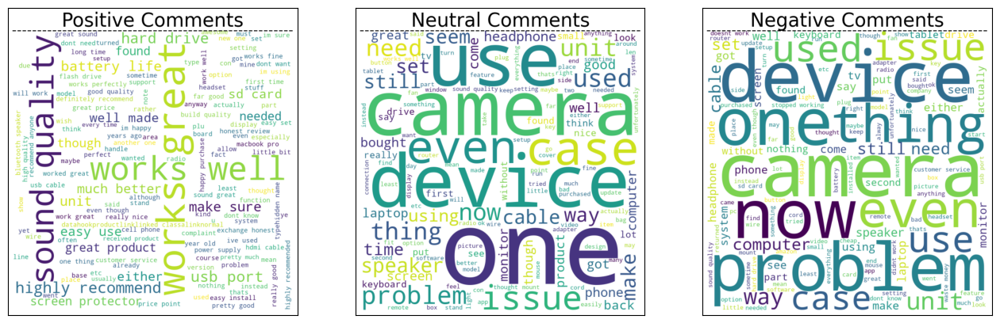

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(16, 8))
axes[0].imshow(plt.imread('/content/drive/MyDrive/Colab Notebooks/Project 2 - NLP/Positive Wordcloud.png'))
axes[1].imshow(plt.imread('/content/drive/MyDrive/Colab Notebooks/Project 2 - NLP/Neutral Wordcloud.png'))
axes[2].imshow(plt.imread('/content/drive/MyDrive/Colab Notebooks/Project 2 - NLP/Negative Wordcloud.png'))
axes[0].set_xticks([]), axes[0].set_yticks([]), axes[1].set_xticks([]), axes[1].set_yticks([]), axes[2].set_xticks([]), axes[2].set_yticks([])
plt.show()

In [ ]:
top_10_reviewers = df.groupby('reviewerID')['vote'].sum().nlargest(10)
print('Top 10 reviewers by votes :')

for reviewer_id, votes in top_10_reviewers.items():
    reviewer_name = df.loc[df['reviewerID'] == reviewer_id, 'reviewerName'].iloc[0]
    print(f"{reviewer_name}: {votes}")

Top 10 reviewers by votes :
Benson Leung: 4572
Voltron00x: 3181
Obi Wan: 3150
nycebo: 2978
Mayra S.: 2631
Cthulhu: 2607
Chris Upton: 2167
Sally B.: 1912
DJ: 1867
Mark A. Baker: 1820


#### Drawing some charts to better understand the review texts.

In [ ]:
import plotly.express as px

review_length_series = df['reviewText'].apply(len)

fig = px.histogram(x=review_length_series, nbins=100 , title='Histogram of Review Length')
fig.update_layout(xaxis_title='Number of Characters', yaxis_title='Frequency')
fig.show()

review_length_no_outliers_series = review_length_series[review_length_series < 3000]

fig = px.histogram(x=review_length_no_outliers_series, nbins=100 , title='Histogram of Review Length')
fig.update_layout(xaxis_title='Number of Characters', yaxis_title='Frequency')
fig.show()

In [ ]:
word_counts = {}
for text in df['reviewText']:
    words = text.split()
    for word in words:
        if word in word_counts:
            word_counts[word] += 1
        else:
            word_counts[word] = 1

sorted_word_counts = sorted(word_counts.values(), reverse=True)
filtered_word_counts = [count for count in sorted_word_counts if count < 1000]

sequence_lengths = [len(text.split()) for text in df['reviewText']]

fig = px.histogram(x=filtered_word_counts, nbins=1000, title='Histogram of Word Frequencies')
fig.update_layout(xaxis_title='Word', yaxis_title='Word Frequency')
fig.show()

fig = px.histogram(x=sequence_lengths, nbins=200, title='Histogram of Sequence Lengths')
fig.update_layout(xaxis_title='Number of Sentences', yaxis_title='Sentences Length')
fig.show()

In [ ]:
top_products = df[df['overall'] == 5].groupby(['title', 'brand']).size().nlargest(10).reset_index(name='5 Ratings')
top_products

,title,brand,5 Ratings
0,OontZ Angle 3 Enhanced Stereo Edition IPX5 Spl...,Cambridge Soundworks,1163
1,NETGEAR N300 WiFi Range Extender (EX2700),NETGEAR,659
2,Roku Streaming Stick (3600R) - HD Streaming Pl...,Roku,600
3,Logitech M570 Wireless Trackball Mouse &ndash;...,Logitech,552
4,Samsung 850 EVO 500GB 2.5-Inch SATA III Intern...,Samsung,529
5,ASUS Tri-Band Gigabit (AC3200) WiFi Router (Up...,Asus,442
6,Cheetah Mounts APFMSB TV Wall Mount Bracket fo...,Cheetah,434
7,Arlo - Wireless Home Security Camera System | ...,"Arlo Technologies, Inc",433
8,Samsung 850 EVO 250GB 2.5-Inch SATA III Intern...,Samsung,431
9,Sabrent 4-Port USB 3.0 Hub with Individual LED...,Sabrent,415


In [ ]:
top_brands = df.groupby('brand').agg({'overall': ['count', 'mean']})
top_brands.columns = ['ReviewCount', 'mean']
top_brands = top_brands.nlargest(10, 'ReviewCount')
top_brands

,ReviewCount,mean
brand,,
Logitech,16829,3.950740
Samsung,15400,3.941104
AmazonBasics,13213,4.201468
Asus,11882,3.854738
Sony,11593,3.917278
Anker,9860,4.244320
TP-LINK,9773,3.928681
SanDisk,8347,3.956511
Sabrent,7307,4.028055


### Part 2 : we want to see if mentioning the word 'Guarantee' and similar words is correlated to how customers rate a product.

In [ ]:
embeddings_index = {}
with open('/content/glove.6B.300d.txt', encoding="utf8") as f:
    for line in f:
        values = line.split()
        word = values[0]
        coefs = np.asarray(values[1:], dtype='float32')
        embeddings_index[word] = coefs

Find words similar to 'guarantee' and 'warranty'.

In [ ]:
words_to_compare = ['guarantee', 'warranty']

word_embeddings = {}
for word in words_to_compare:
    if word in embeddings_index:
        word_embeddings[word] = embeddings_index[word]

def cosine_similarity(a, b):
    dot_product = np.dot(a, b)
    norm_a = np.linalg.norm(a)
    norm_b = np.linalg.norm(b)
    return dot_product / (norm_a * norm_b)

similar_words = {}
for word, emb in embeddings_index.items():
    if word not in words_to_compare:
        if len(word_embeddings) == 0:
            continue
        similarities = [cosine_similarity(emb, word_emb) for word_emb in word_embeddings.values()]
        similar_words[word] = sum(similarities) / len(similarities)

similar_words = {k: v for k, v in sorted(similar_words.items(), key=lambda item: item[1], reverse=True)}

N = 20
print(f"Top {N} similar words to 'guarantee' and 'warranty':")
for word, score in list(similar_words.items())[:N]:
    print(f"{word}: {score:.4f}")

Top 20 similar words to 'guarantee' and 'warranty':
guarantees: 0.5658
guaranteed: 0.5425
warranties: 0.5157
guaranteeing: 0.4698
insure: 0.4691
ensure: 0.4003
protection: 0.3918
ensures: 0.3871
payment: 0.3812
ensuring: 0.3727
assure: 0.3726
provide: 0.3725
assurance: 0.3720
obligations: 0.3716
obligation: 0.3700
insurance: 0.3682
extend: 0.3681
protections: 0.3590
pay: 0.3541
liability: 0.3519


Define a function to check if the word 'guarantee' or any similar words exist in a string.

In [ ]:
from fuzzywuzzy import process, fuzz
import re

WORD_LIST = ['insurance', 'guarantee', 'warranty', 'guarantees', 'guaranteed', 'warranties', 'guaranteeing']

def preprocess_fuzzy_matching(word):
    word = re.sub(r'[^\w\s]', '', word)
    word = word.strip()
    return word.lower()

def check_similarity_of_sentence(input_sentence, word_list=WORD_LIST, threshold=84):
    for word in input_sentence.split():
        word = preprocess_fuzzy_matching(word)

        if not word:
            continue

        if word in word_list:
            return True

        fuzzy_matches = process.extract(word, word_list, scorer=fuzz.ratio)
        for match in fuzzy_matches:
            if match[1] >= threshold:
                return True
    return False

Create a new column that shows whether the word 'guarantee' or any similar words exist in the reviewText column.

In [ ]:
from tqdm.auto import tqdm
tqdm.pandas()

df['warranty in review'] = df['reviewText'].progress_apply(check_similarity_of_sentence)

In [ ]:
warranty_percent_by_overall = df.groupby('overall')['warranty in review'].value_counts(normalize=True) * 100
warranty_percent_by_overall = warranty_percent_by_overall.unstack().reset_index()

In [ ]:
df.to_csv('/content/drive/MyDrive/Colab Notebooks/Project 2 - NLP/df_modified.csv', index=False)

In [ ]:
percentages_without_guarantee = warranty_percent_by_overall[False].to_list()
percentages_with_guarantee = warranty_percent_by_overall[True].to_list()

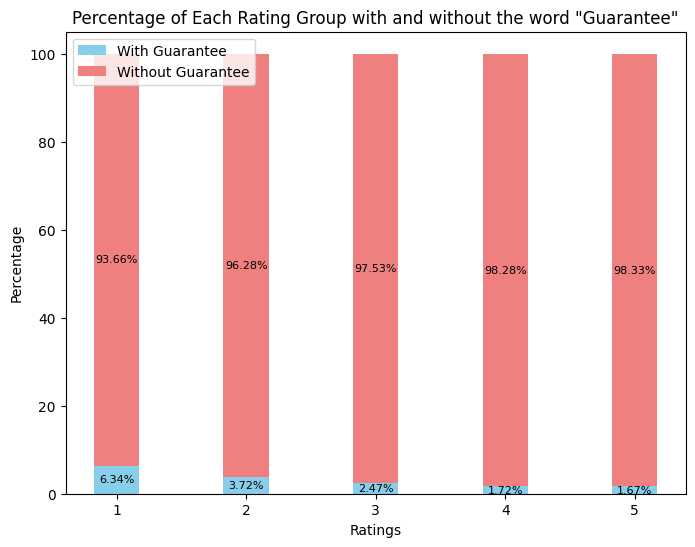

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

ratings = [1, 2, 3, 4, 5]

# Plotting the 100% stacked bar chart
fig, ax = plt.subplots(figsize=(8, 6))

bar_width = 0.35
bar_l = np.arange(len(ratings))

bars_with_guarantee = plt.bar(bar_l, percentages_with_guarantee, width=bar_width, label='With Guarantee', color='skyblue')
bars_without_guarantee = plt.bar(bar_l, percentages_without_guarantee, width=bar_width, bottom=percentages_with_guarantee, label='Without Guarantee', color='lightcoral')

plt.xlabel('Ratings')
plt.ylabel('Percentage')
plt.title('Percentage of Each Rating Group with and without the word "Guarantee"')
plt.xticks(bar_l, ratings)
plt.legend(loc='upper left')

# Add text annotations for each part of the bars
for bar1, bar2 in zip(bars_with_guarantee, bars_without_guarantee):
    height1 = bar1.get_height()
    height2 = bar2.get_height()
    total_height = height1 + height2

    # Display the percentages inside each part of the bar
    ax.text(
        bar1.get_x() + bar1.get_width() / 2,
        height1 / 2,
        f'{height1:.2f}%',
        ha='center',
        va='center',
        color='black',
        fontsize=8
    )

    ax.text(
        bar2.get_x() + bar2.get_width() / 2,
        height1 + height2 / 2,
        f'{height2:.2f}%',
        ha='center',
        va='center',
        color='black',
        fontsize=8
    )

plt.show()


### Part 3 : Sentiment analysis

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, Embedding, LSTM, SpatialDropout1D, Bidirectional, Dropout
from keras import regularizers
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
from keras.callbacks import EarlyStopping

X = df['reviewText']
y = df['overall']

max_words = 10000
max_len = 500
tokenizer = Tokenizer(num_words=max_words, split=' ')
tokenizer.fit_on_texts(X)
X = tokenizer.texts_to_sequences(X)
X = pad_sequences(X, maxlen=max_len)

y = np.array(y) - 1
y = np.eye(5)[y]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Load pre-trained GloVe embeddings with 200 dimensions
embeddings_index = {}
f = open('/content/glove.6B.200d.txt', encoding='utf-8')
for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()

# Create embedding matrix with 200 dimensions
embedding_matrix = np.zeros((max_words, 200))
for word, i in tokenizer.word_index.items():
    if i < max_words:
        embedding_vector = embeddings_index.get(word)
        if embedding_vector is not None:
            embedding_matrix[i] = embedding_vector

# Build the model with a more complex architecture and pre-trained GloVe embeddings
model = Sequential()
model.add(Embedding(max_words, 200, weights=[embedding_matrix], input_length=max_len, trainable=False))
model.add(SpatialDropout1D(0.4))
model.add(Bidirectional(LSTM(256, return_sequences=True)))
model.add(Bidirectional(LSTM(128, return_sequences=True)))
model.add(Bidirectional(LSTM(64)))
model.add(Dense(128, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(5, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

early_stopping = EarlyStopping(monitor = 'val_accuracy',
                               patience=3,
                               restore_best_weights=True)

# Train the model with the more complex architecture
model.fit(X_train, y_train, epochs=10, batch_size=64, validation_data=(X_test, y_test), callbacks=[early_stopping])

# Evaluate the model with the more complex architecture
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Loss: {loss}, Accuracy: {accuracy}')


#### Confusion matrix and classification report

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report

# Make predictions on the test set
y_pred = model.predict(X_test)

# Compute the confusion matrix
cm = confusion_matrix(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))

# Display the confusion matrix using ConfusionMatrixDisplay
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues', values_format='d')

# Add titles and show the plot
plt.title('Confusion Matrix')
plt.show()

print(classification_report(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1)))

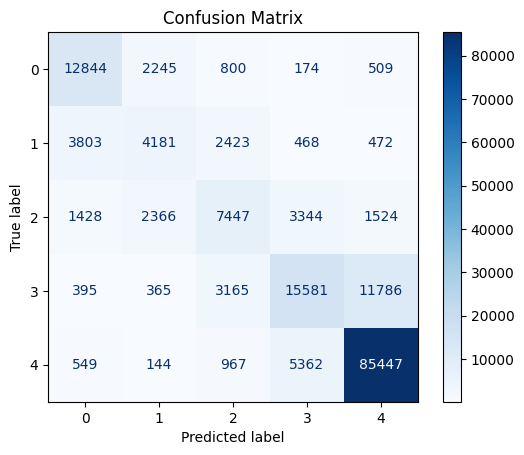

              precision    recall  f1-score   support

           0       0.68      0.78      0.72     16572
           1       0.45      0.37      0.40     11347
           2       0.50      0.46      0.48     16109
           3       0.63      0.50      0.55     31292
           4       0.86      0.92      0.89     92469

    accuracy                           0.75    167789

#### Make predictions on an string

In [ ]:
submit_data = pd.read_csv('test_data.csv')

text_to_sequences = submit_data['reviewText']
text_to_sequences = tokenizer.texts_to_sequences(text_to_sequences)
text_to_sequences = pad_sequences(text_to_sequences, maxlen=max_len)

predictions = model.predict(text_to_sequences)
predictions = np.argmax(predictions, axis=1) + 1

predictions = pd.DataFrame(predictions.tolist())
predictions.columns = ['predicted']
predictions.to_csv('q2_submission.csv', index=False)